## Tutorials of CPS on large scale dataset

In [1]:
import os,sys
sys.path.append(os.path.realpath(os.path.join(os.getcwd(), '..')))
import warnings
warnings.filterwarnings("ignore")

In [2]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import CPS

In [3]:
opt = CPS.config()
args = opt.parse_args(['--seed', '2025'])
args.prep_scale = True
args.dataset_path = '/mnt/d/Dataset/SRT_Dataset/VHD/'
args.radius=50
args.max_neighbors = 8
args.batch_size=4096
args.max_epoch=20
args.lr=1e-3
args.hvgs=2000
args.sigma=1
args.freq=32
args.er_w=1.
CPS.set_random_seed(args.seed)

In [4]:
position_file = args.dataset_path+'binned_outputs/square_008um/spatial/tissue_positions.parquet'
position_csv = args.dataset_path+'binned_outputs/square_008um/spatial/tissue_positions_list.csv'
if  not os.path.exists(position_csv):
    tissue_position_df = pd.read_parquet(position_file)
    tissue_position_df.to_csv(position_csv, index=False, header=None)
adata = sc.read_visium(path = args.dataset_path+'binned_outputs/square_008um')
adata

AnnData object with n_obs × n_vars = 393543 × 19059
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [5]:
adata.var_names_make_unique()
adata.layers["counts"] = adata.X.copy()
sc.pp.highly_variable_genes(adata, flavor="seurat_v3", n_top_genes=args.hvgs)
adata_hvg = adata[:, adata.var['highly_variable']]
sc.pp.normalize_total(adata_hvg, target_sum=1e4)
sc.pp.log1p(adata_hvg)
adata_hvg.layers['log1p'] = adata_hvg.X.copy()

In [6]:
genes_of_interest = [
    'Hpca', 'Mbp', 'Rorb', 'Pcp4', 'Foxp2', 
    'Drd1', 'Penk', 'Ttr', 'Plp1', 'Gad1'
]

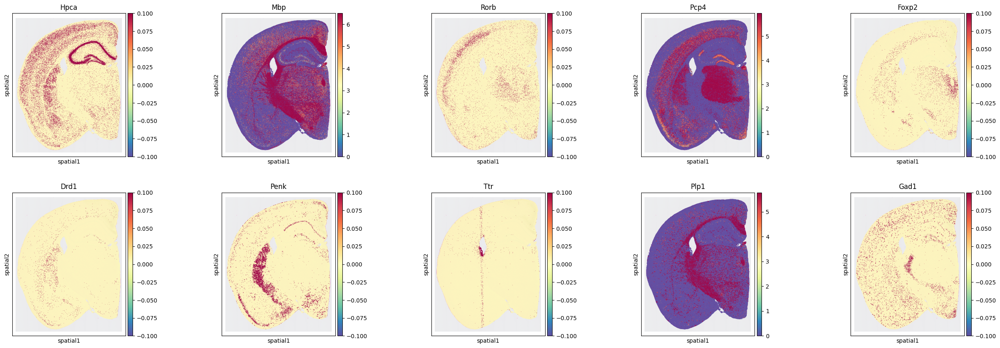

In [7]:
sc.pl.spatial(
    adata_hvg, layer='log1p',
    color=genes_of_interest, 
    spot_size=50, 
    color_map='Spectral_r', #'inferno'
    vmax='p90', wspace=0., ncols=5)

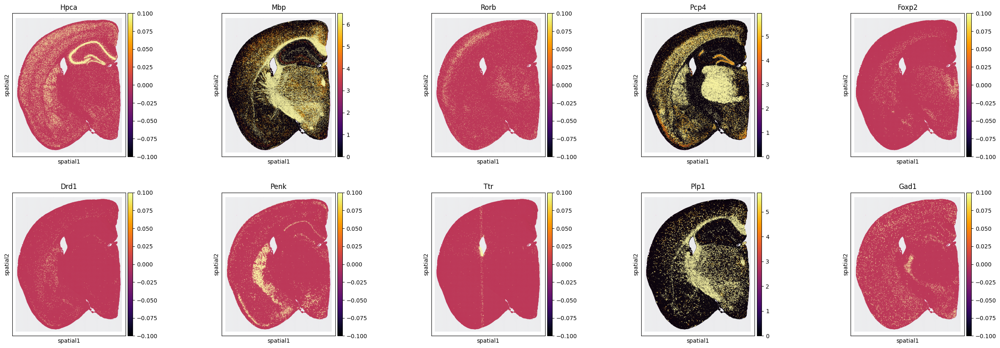

In [8]:
sc.pl.spatial(
    adata_hvg, layer='log1p',
    color=genes_of_interest, 
    spot_size=50, 
    color_map='inferno', #'inferno'
    vmax='p90', wspace=0., ncols=5)

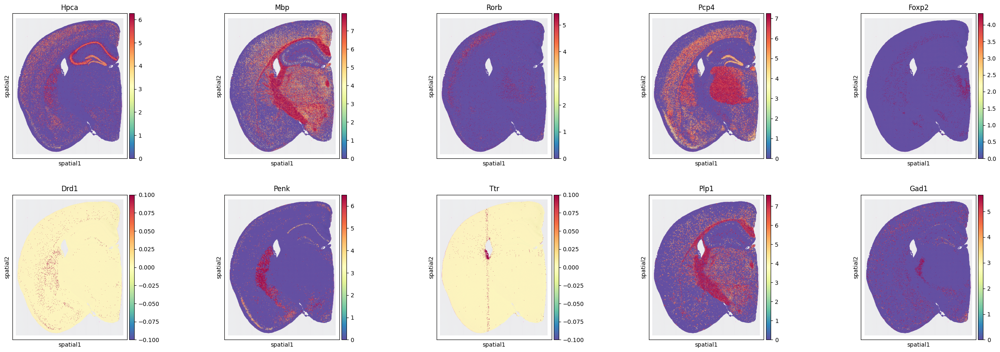

In [9]:
sc.pl.spatial(
    adata_hvg, layer='log1p',
    color=genes_of_interest, 
    spot_size=50, 
    color_map='Spectral_r', #'inferno'
    vmax='p99', wspace=0., ncols=5)

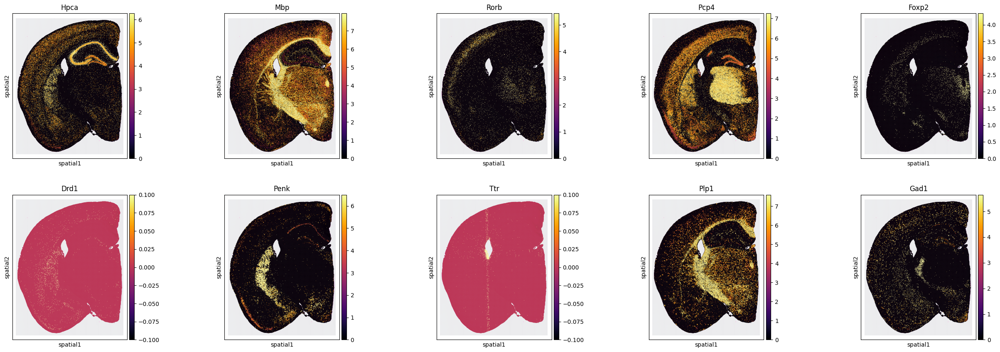

In [10]:
sc.pl.spatial(
    adata_hvg, layer='log1p',
    color=genes_of_interest, 
    spot_size=50, 
    color_map='inferno', #'inferno'
    vmax='p99', wspace=0., ncols=5)

In [11]:
sc.pp.scale(adata_hvg)

counts_layer = adata_hvg.layers['counts']
adata_hvg.obsm['hvg_features'] = adata_hvg.X
adata_hvg.obsm['hvg_counts'] = counts_layer.toarray()
adata_hvg

AnnData object with n_obs × n_vars = 393543 × 2000
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'spatial', 'hvg', 'log1p'
    obsm: 'spatial', 'hvg_features', 'hvg_counts'
    layers: 'counts', 'log1p'

### offline graph tokenizer

In [12]:
spatial_edge = CPS.SpatialGraphBuilder(args)
pyg_data = spatial_edge.build_large_graph(adata_hvg, method='knn')
print(pyg_data.num_nodes, pyg_data.num_genes, pyg_data.edge_index.shape)

393543 2000 torch.Size([2, 3548869])


In [13]:
from CPS.module import MultiHopSGConv
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import StandardScaler
import torch
tokenizer = MultiHopSGConv(k_list=args.k_list, prep_scale=True)
input_feat = pyg_data.x.cpu().numpy()
svd = TruncatedSVD(n_components=64, algorithm='randomized', random_state=42)
x_reduced = svd.fit_transform(input_feat)
scaler = StandardScaler()
x_reduced = scaler.fit_transform(x_reduced)
pyg_data.x = torch.from_numpy(x_reduced).float()
tokens = tokenizer(pyg_data.x, pyg_data.edge_index)
pyg_data.x = tokens

Use CPS efficient fit

In [14]:
import time
start_time = time.time()
cps_model = CPS.CPSTrainer(args, input_dim=64)
cps_model.efficient_fit(pyg_data, print_every=1)
end_time = time.time()
print(f"time: {end_time - start_time:.4f} s")

  0%|          | 0/20 [00:00<?, ?it/s]


Epoch   0: Train[Total:0.9241, T:0.5852, S:0.0636, D:0.2752]

Epoch   1: Train[Total:0.2216, T:0.0587, S:0.0617, D:0.1013]

Epoch   2: Train[Total:0.1575, T:0.0582, S:0.0610, D:0.0383]

Epoch   3: Train[Total:0.1366, T:0.0581, S:0.0608, D:0.0177]

Epoch   4: Train[Total:0.1286, T:0.0580, S:0.0607, D:0.0098]

Epoch   5: Train[Total:0.1249, T:0.0581, S:0.0608, D:0.0060]

Epoch   6: Train[Total:0.1239, T:0.0583, S:0.0609, D:0.0048]

Epoch   7: Train[Total:0.1227, T:0.0584, S:0.0607, D:0.0035]

Epoch   8: Train[Total:0.1213, T:0.0582, S:0.0607, D:0.0023]

Epoch   9: Train[Total:0.1208, T:0.0582, S:0.0609, D:0.0018]

Epoch  10: Train[Total:0.1204, T:0.0580, S:0.0609, D:0.0014]

Epoch  11: Train[Total:0.1200, T:0.0579, S:0.0609, D:0.0011]

Epoch  12: Train[Total:0.1197, T:0.0579, S:0.0610, D:0.0009]

Epoch  13: Train[Total:0.1194, T:0.0577, S:0.0609, D:0.0007]

Epoch  14: Train[Total:0.1197, T:0.0581, S:0.0609, D:0.0007]

Epoch  15: Train[Total:0.1191, T:0.0577, S:0.0608, D:0.0006]

Epoch  

In [15]:
imputed_expr, z_s = cps_model.infer_postion(pyg_data)
adata_hvg.layers['imputed'] = imputed_expr.detach().cpu().numpy()
adata_hvg.obsm['z_s'] = z_s.detach().cpu().numpy()
adata_hvg.layers['imputed_log1p'] = np.log1p(adata_hvg.layers['imputed'])

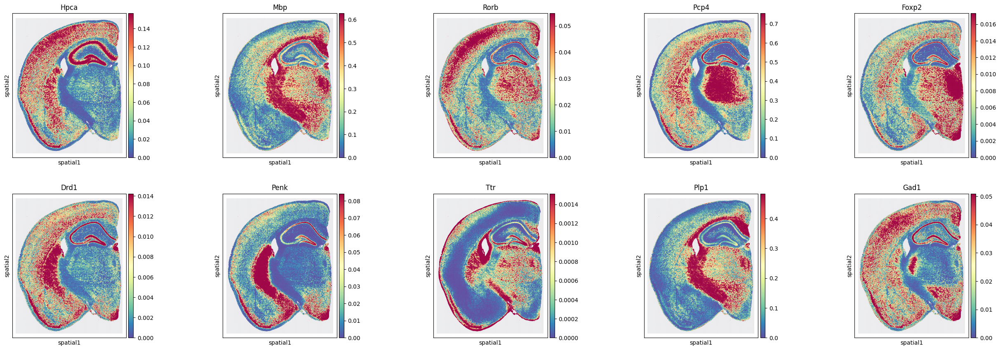

In [16]:
sc.pl.spatial(
    adata_hvg, 
    color=genes_of_interest, 
    spot_size=50, layer='imputed_log1p',
    color_map='Spectral_r', 
    vmax='p90',ncols=5, wspace=0.
)

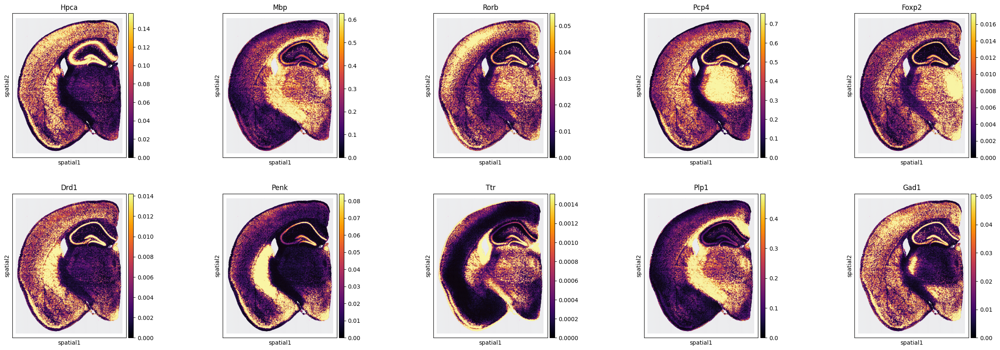

In [17]:
sc.pl.spatial(
    adata_hvg, 
    color=genes_of_interest, 
    spot_size=50, layer='imputed_log1p',
    color_map='inferno', 
    vmax='p90',ncols=5, wspace=0.
)

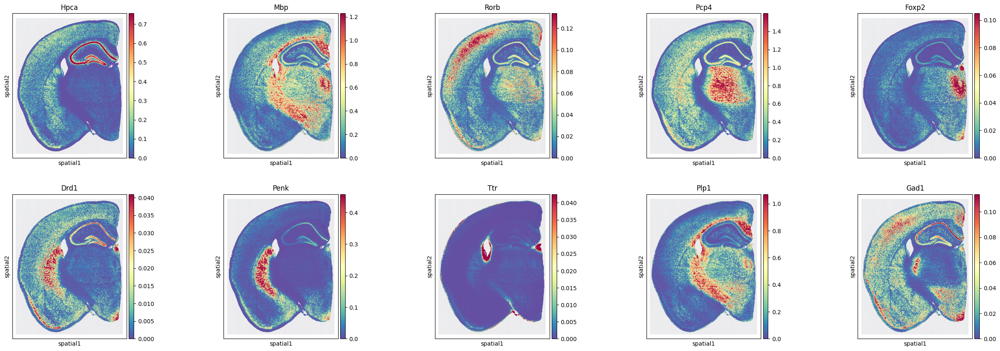

In [18]:
sc.pl.spatial(
    adata_hvg, 
    color=genes_of_interest, 
    spot_size=50, layer='imputed_log1p',
    color_map='Spectral_r', 
    vmax='p99',ncols=5, wspace=0.
)

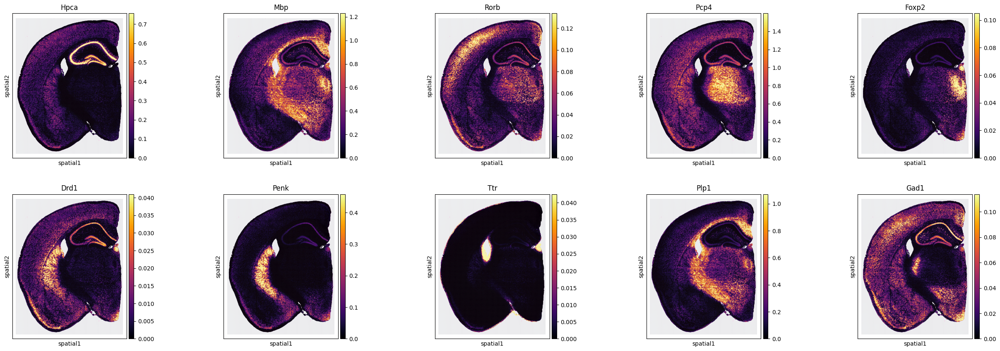

In [19]:
sc.pl.spatial(
    adata_hvg, 
    color=genes_of_interest, 
    spot_size=50, layer='imputed_log1p',
    color_map='inferno', 
    vmax='p99',ncols=5, wspace=0.
)